In [7]:

import os
import rasterio
import numpy as np
from skimage.io import imread
from data_generator import CustomDataGenerator
import tensorflow as tf
from UnetPP import UnetPP
from UNet import Unet
from losses.focal_tversky import FocalTverskyLoss
from losses.dice_loss import multilabel_dice_coef_loss
from keras import backend as K
from tensorflow.keras.layers import Input
from tensorflow.keras.optimizers import Adam
# from sklearn.model_selection import train_test_split
import gc
import random

In [8]:
images_path = "../data/test_2/resized_800 – Kopi/"
labels_path = "../data/labels/shoreline/"
all_labels = [os.path.splitext(file)[0] for file in os.listdir(labels_path)]
n_classes = 2
image_size = (300, 800)
batch_size = 8
train_test_split = 0.8
random.shuffle(all_labels)
train_image_ids = all_labels[:int(len(all_labels)*train_test_split)]
val_image_ids = all_labels[int(len(all_labels)*train_test_split):]
from_logits=False
train_data_generator = CustomDataGenerator(images_path, labels_path, train_image_ids, image_size=image_size, batch_size=batch_size, n_classes=n_classes, logits=from_logits)
val_data_generator = CustomDataGenerator(images_path, labels_path, val_image_ids, image_size=image_size, batch_size=batch_size, n_classes=n_classes, logits=from_logits)

In [10]:
K.clear_session()
gc.collect()
h, w = image_size
gpu_device = "/device:GPU:0"

with tf.device(gpu_device):
    input_img = Input((h, w, 3), name='img')
    

    model = UnetPP((h, w, 3), n_classes, using_deep_supervision=True)
    metrics = [tf.keras.metrics.IoU(num_classes=n_classes, target_class_ids = [0,1]),
     tf.keras.metrics.MeanIoU(n_classes,ignore_class=[0]),
               "accuracy"]
    model.compile(optimizer=Adam(learning_rate=0.00005), loss="categorical_crossentropy", metrics=metrics)

In [11]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=1,          # Number of epochs with no improvement before stopping
    verbose=1,
    restore_best_weights=True# Print a message when training is stopped
)

results = model.fit(train_data_generator,
                    validation_data=val_data_generator,
                    epochs=20,
                    verbose=1,
                    callbacks=[early_stopping] #{0:0.05, 1:0.2, 2:0.45, 3:0.30} beste så langt(iou her burde være høy!) patience=1
                    )
# siste jeg vil prøve er pixel normalisering
# må også finne ut hvorfor iou ikke blir riktig her, det er noe galt jeg kan jo se att det skal være mye høyere
# kan ganske enkelt regne den ut selv da ved å se på antall pixler predictet av denne klassen vs union 
# selvom det ser ut som loss konvergerer, går val loss konstant ned

# shuffle før trening
# regne iou for hver klasse
# pixel normalisering

Epoch 1/20
37/37 [==============================] - 51s 1s/step - loss: 2.6458 - output_1_loss: 1.2044 - output_2_loss: 0.5542 - output_3_loss: 0.5659 - output_4_loss: 0.3214 - output_1_io_u: 0.2500 - output_1_mean_io_u: 1.3841e-06 - output_1_accuracy: 0.1969 - output_2_io_u: 0.2500 - output_2_mean_io_u: 3.5674e-08 - output_2_accuracy: 0.7970 - output_3_io_u: 0.2500 - output_3_mean_io_u: 2.8539e-08 - output_3_accuracy: 0.7702 - output_4_io_u: 0.2500 - output_4_mean_io_u: 7.1347e-09 - output_4_accuracy: 0.9153 - val_loss: 6.4896 - val_output_1_loss: 2.5554 - val_output_2_loss: 1.4720 - val_output_3_loss: 1.6160 - val_output_4_loss: 0.8462 - val_output_1_io_u: 0.2500 - val_output_1_mean_io_u: 1.9707e-07 - val_output_1_accuracy: 0.0707 - val_output_2_io_u: 0.2500 - val_output_2_mean_io_u: 0.0000e+00 - val_output_2_accuracy: 0.1638 - val_output_3_io_u: 0.2500 - val_output_3_mean_io_u: 2.8153e-08 - val_output_3_accuracy: 0.1625 - val_output_4_io_u: 0.2500 - val_output_4_mean_io_u: 0.0000e+0

In [12]:
import matplotlib.pyplot as plt
class_colors = {
    0: [0, 0, 0],     # Class 0:  black: background
    1: [0, 255, 0]  # Class 3: red: Menneskapt struktur
}

1/1 [==============================] - 2s 2s/step
iou class 0:  []
iou class 1:  [0.9781152884745304]
iou class 2:  [0.9781152884745304, 0.3793557657765537]
input: 


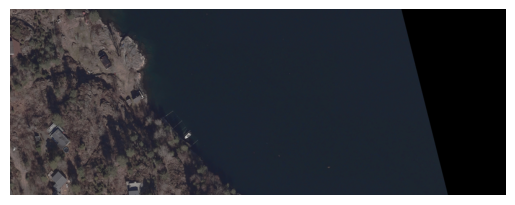

label: 


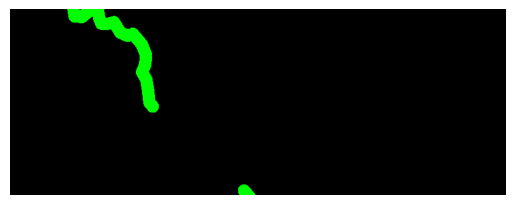

pred: 


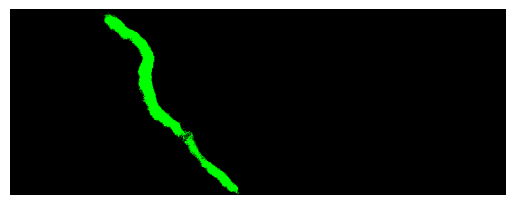

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.977293250295705]
iou class 2:  [0.977293250295705, 0.43496149382846294]
input: 


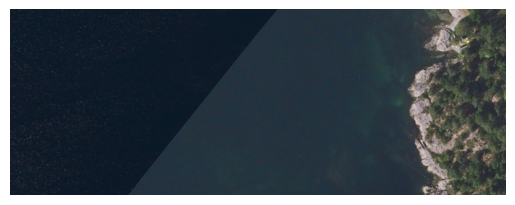

label: 


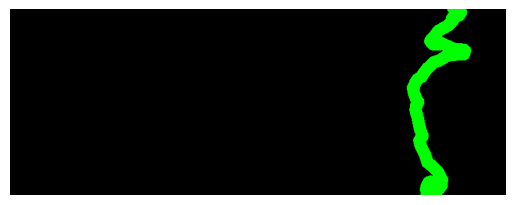

pred: 


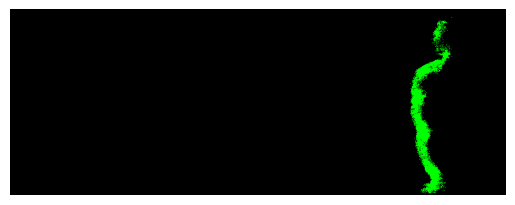

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9808381732336104]
iou class 2:  [0.9808381732336104, 0.12747336377473364]
input: 


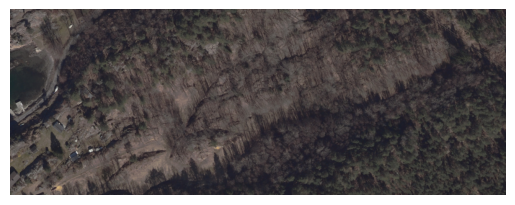

label: 


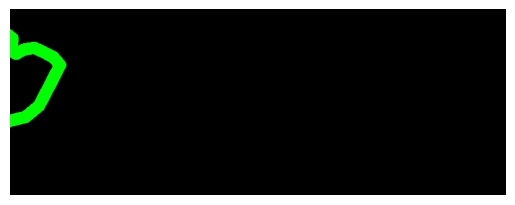

pred: 


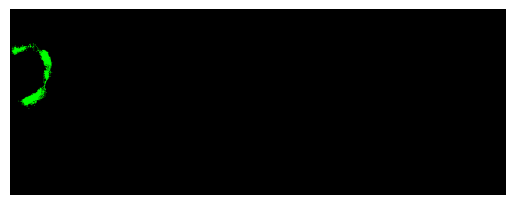

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9589641484152923]
iou class 2:  [0.9589641484152923, 0.041812865497076024]
input: 


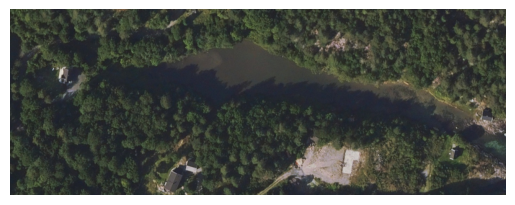

label: 


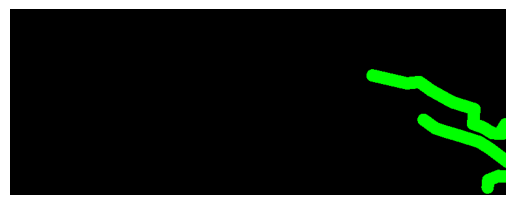

pred: 


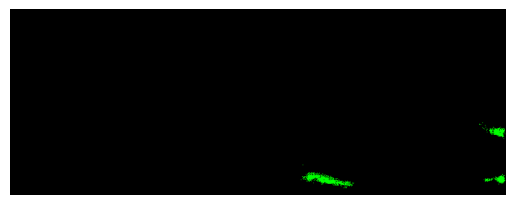

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9972916666666667]
iou class 2:  [0.9972916666666667, 0.0]
input: 


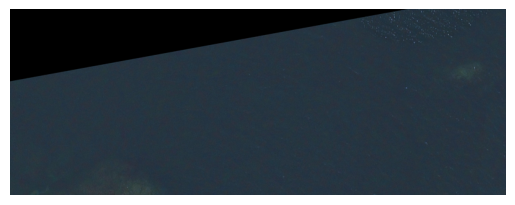

label: 


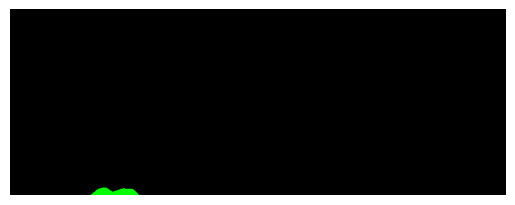

pred: 


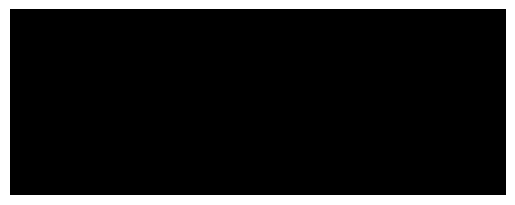

1/1 [==============================] - 0s 29ms/step
iou class 0:  []
iou class 1:  [0.9782726462033386]
iou class 2:  [0.9782726462033386, 0.004961832061068702]
input: 


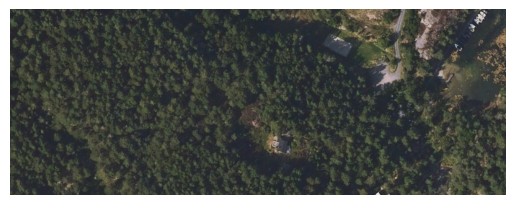

label: 


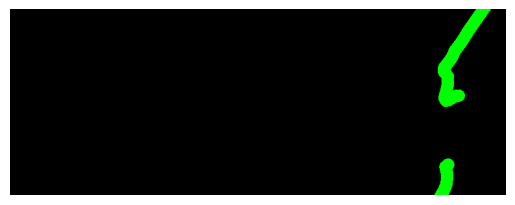

pred: 


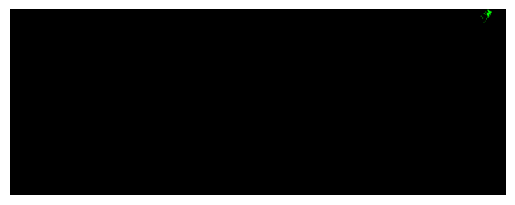

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9579807950577491]
iou class 2:  [0.9579807950577491, 0.14718909710391823]
input: 


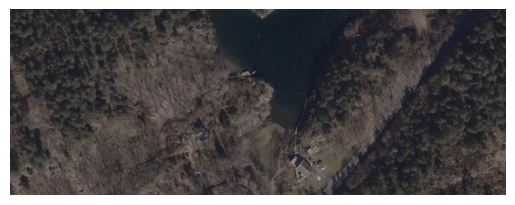

label: 


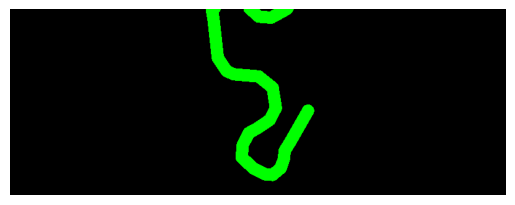

pred: 


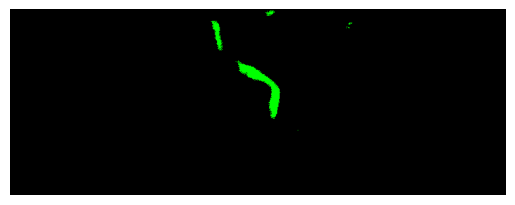

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9624910908960556]
iou class 2:  [0.9624910908960556, 0.24479918485182983]
input: 


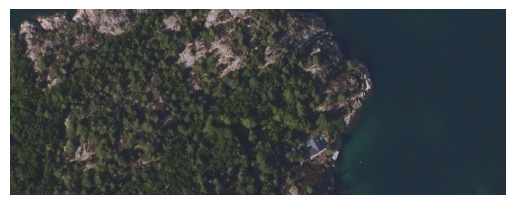

label: 


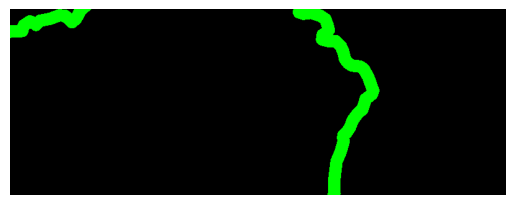

pred: 


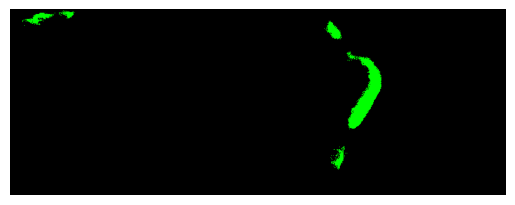

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.9511038780273667]
iou class 2:  [0.9511038780273667, 0.36296172302198415]
input: 


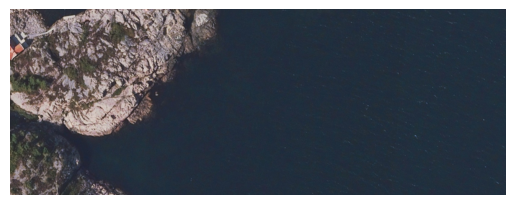

label: 


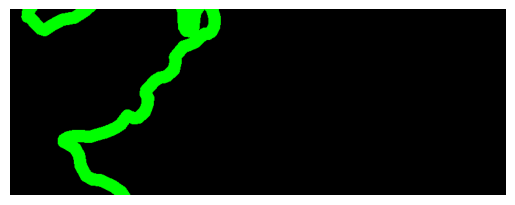

pred: 


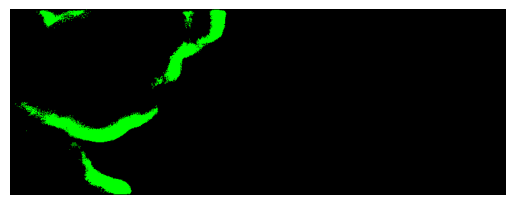

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9171470114763463]
iou class 2:  [0.9171470114763463, 0.31772503741714775]
input: 


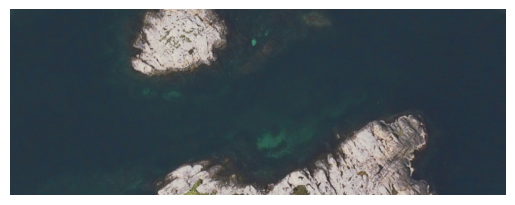

label: 


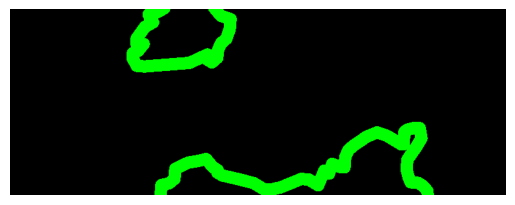

pred: 


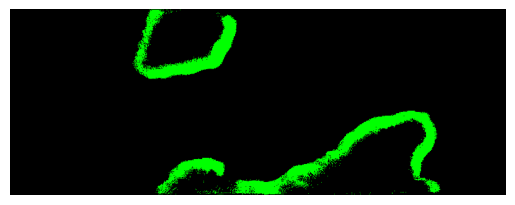

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.88629164146336]
iou class 2:  [0.88629164146336, 0.3985258218187851]
input: 


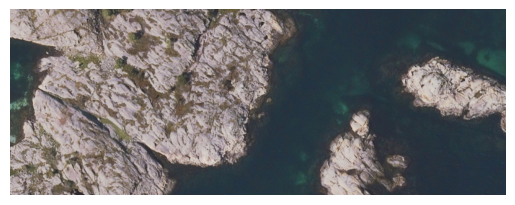

label: 


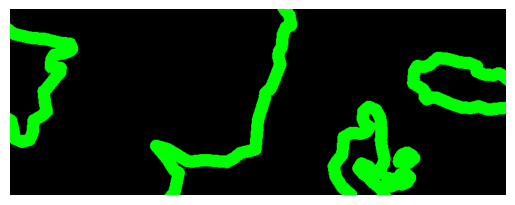

pred: 


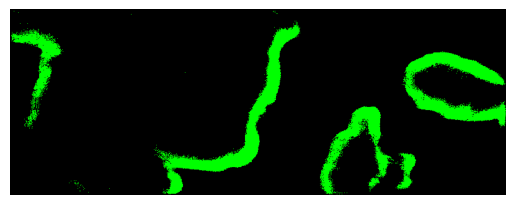

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9385692166316293]
iou class 2:  [0.9385692166316293, 0.10310604668259511]
input: 


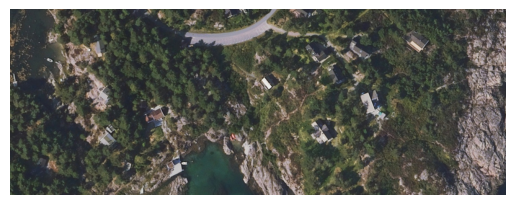

label: 


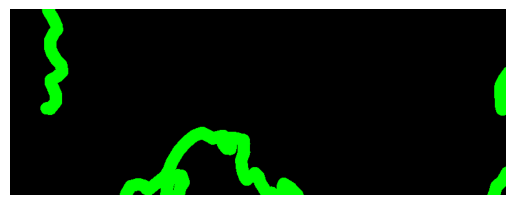

pred: 


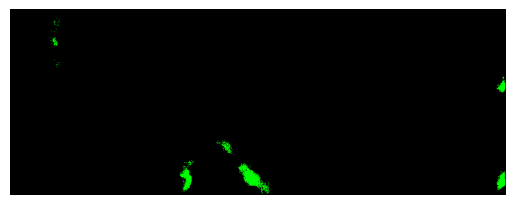

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9848376003706648]
iou class 2:  [0.9848376003706648, 0.5709646379600674]
input: 


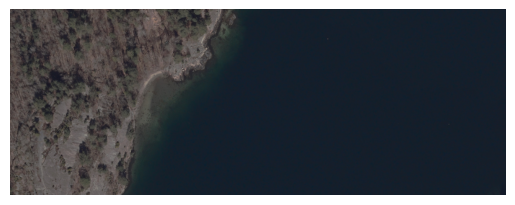

label: 


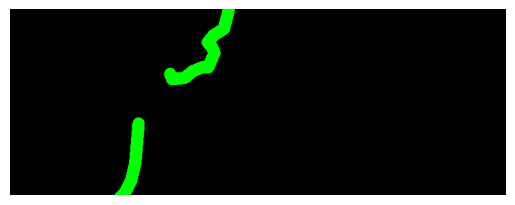

pred: 


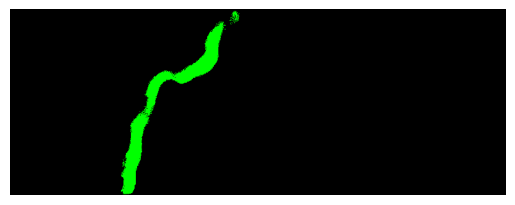

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9941217179943791]
iou class 2:  [0.9941217179943791, 0.6847703100248925]
input: 


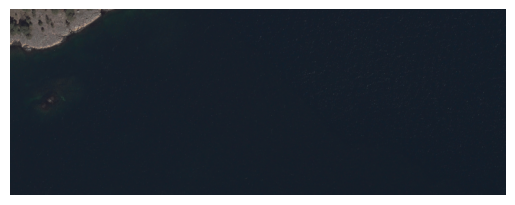

label: 


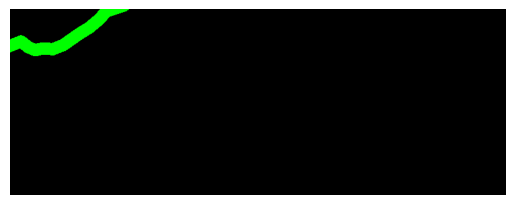

pred: 


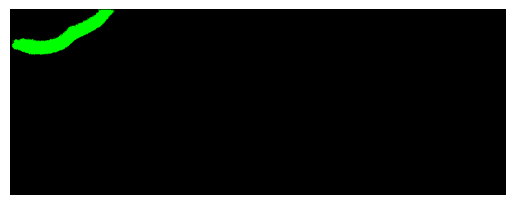

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9765053472954778]
iou class 2:  [0.9765053472954778, 0.553718335098151]
input: 


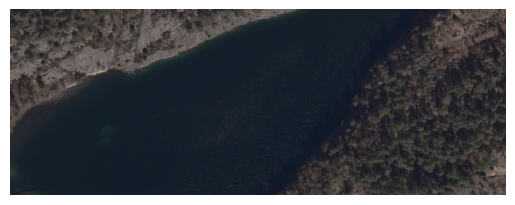

label: 


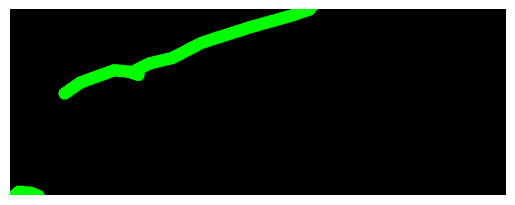

pred: 


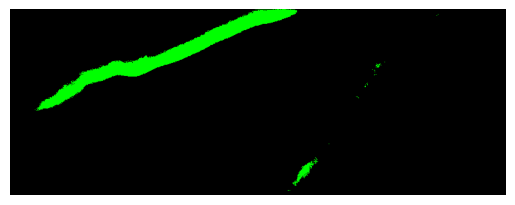

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9445294884710829]
iou class 2:  [0.9445294884710829, 0.4570562622726885]
input: 


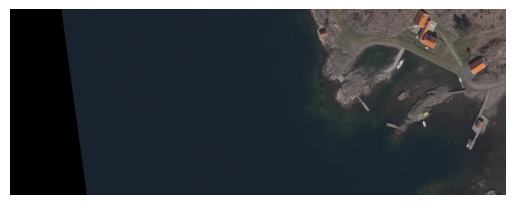

label: 


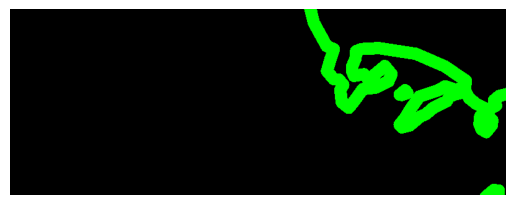

pred: 


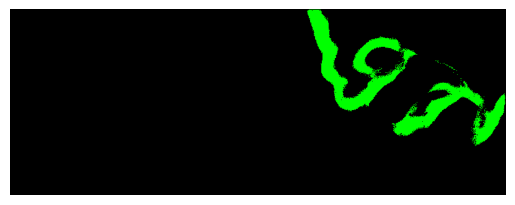

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9335749203699603]
iou class 2:  [0.9335749203699603, 0.2487116505321967]
input: 


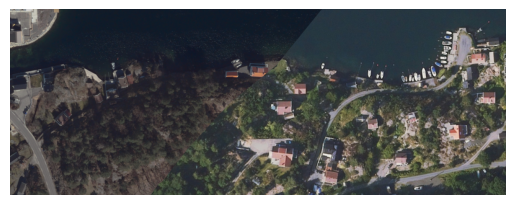

label: 


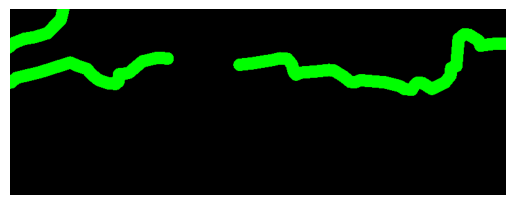

pred: 


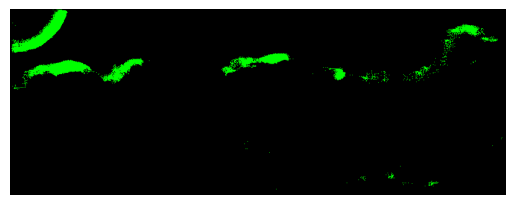

1/1 [==============================] - 0s 36ms/step
iou class 0:  []
iou class 1:  [0.9465399388060673]
iou class 2:  [0.9465399388060673, 0.43761128612518835]
input: 


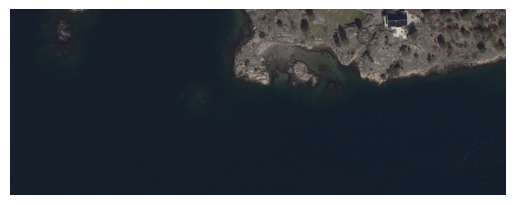

label: 


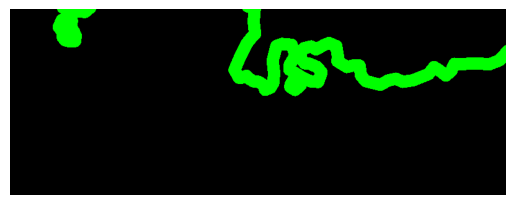

pred: 


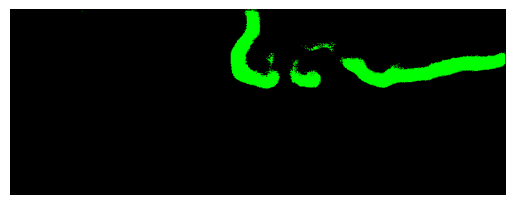

1/1 [==============================] - 0s 26ms/step
iou class 0:  []
iou class 1:  [0.9270525123576565]
iou class 2:  [0.9270525123576565, 0.4234812476147521]
input: 


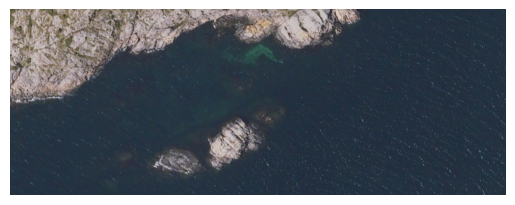

label: 


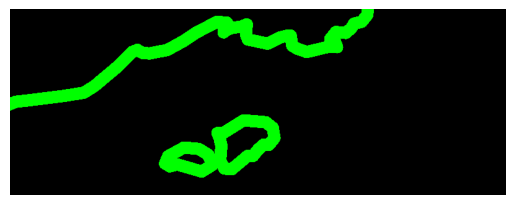

pred: 


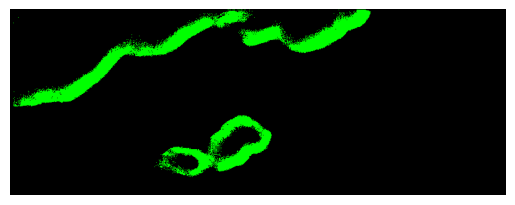

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9127100690735598]
iou class 2:  [0.9127100690735598, 0.4384251968503937]
input: 


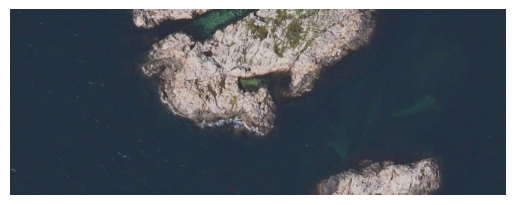

label: 


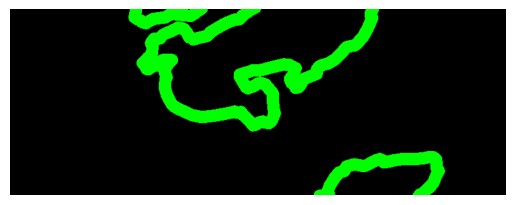

pred: 


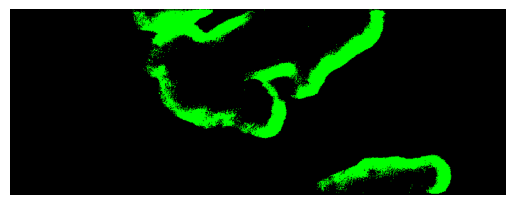

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9539289468152197]
iou class 2:  [0.9539289468152197, 0.16402197131522733]
input: 


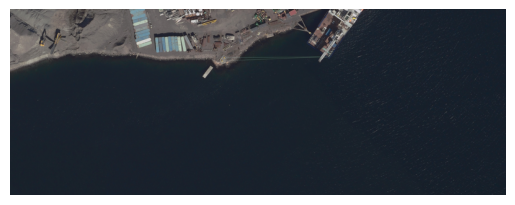

label: 


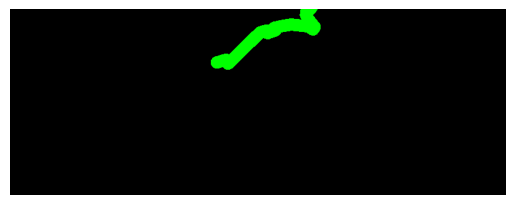

pred: 


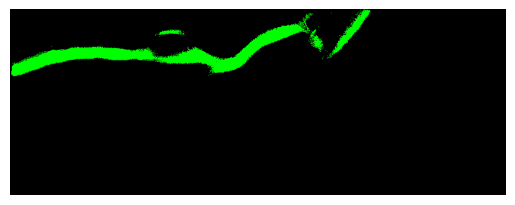

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9221846485975949]
iou class 2:  [0.9221846485975949, 0.13320182236625805]
input: 


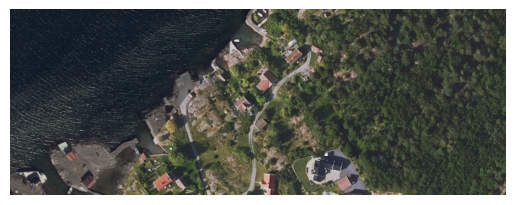

label: 


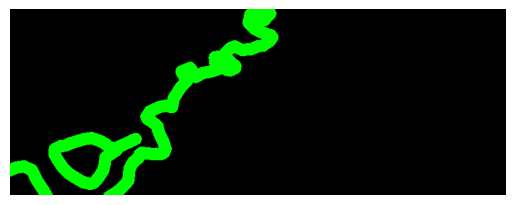

pred: 


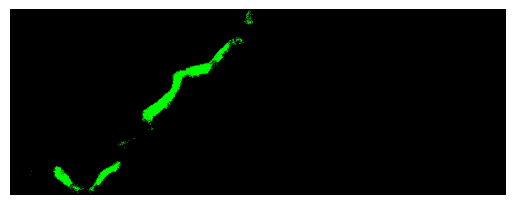

1/1 [==============================] - 0s 29ms/step
iou class 0:  []
iou class 1:  [0.9917719362451256]
iou class 2:  [0.9917719362451256, 0.5379163713678242]
input: 


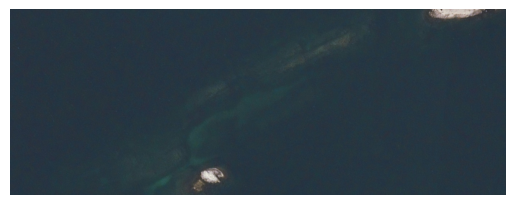

label: 


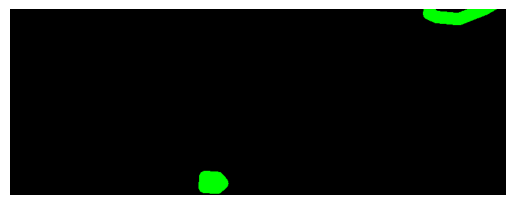

pred: 


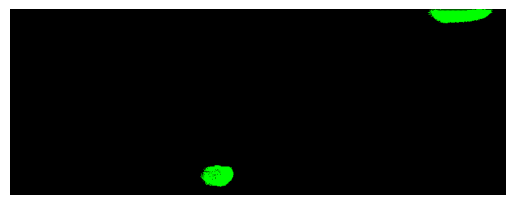

1/1 [==============================] - 0s 30ms/step
iou class 0:  []
iou class 1:  [0.9655275183787005]
iou class 2:  [0.9655275183787005, 0.5152159387717913]
input: 


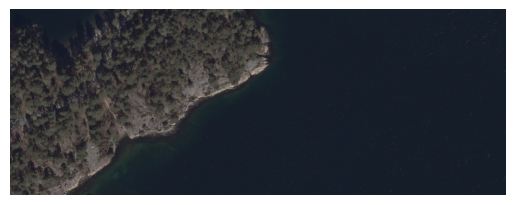

label: 


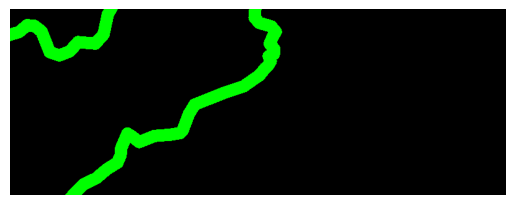

pred: 


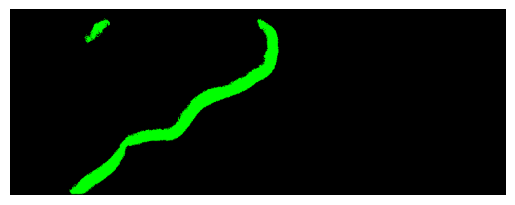

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.8817458523574884]
iou class 2:  [0.8817458523574884, 0.4180293221206256]
input: 


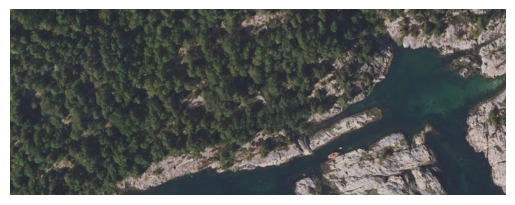

label: 


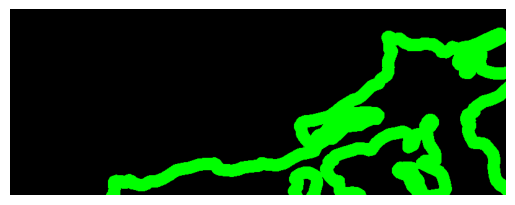

pred: 


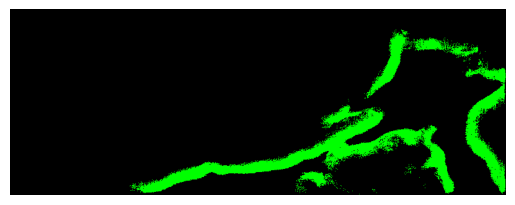

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.955127802154972]
iou class 2:  [0.955127802154972, 0.1148313492063492]
input: 


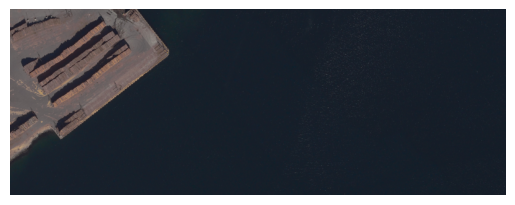

label: 


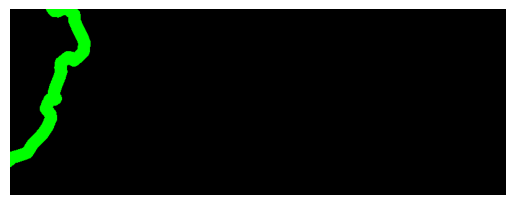

pred: 


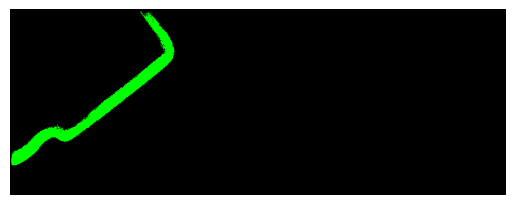

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9564250109468228]
iou class 2:  [0.9564250109468228, 0.5853360831684835]
input: 


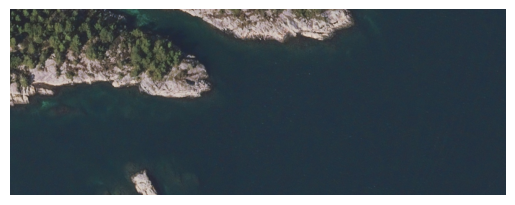

label: 


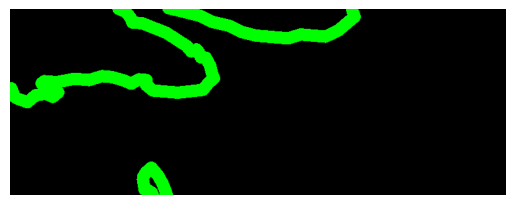

pred: 


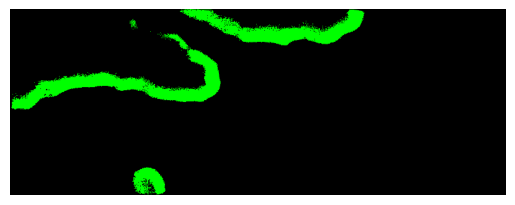

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9891198372808419]
iou class 2:  [0.9891198372808419, 0.4411828189078351]
input: 


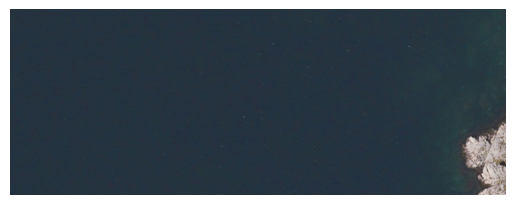

label: 


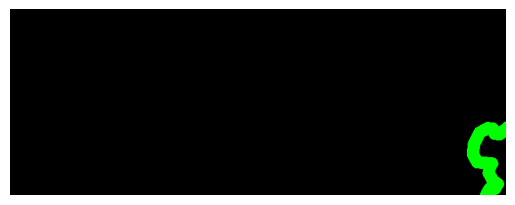

pred: 


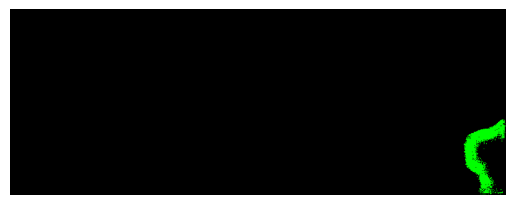

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9521047058183386]
iou class 2:  [0.9521047058183386, 0.08646016286124861]
input: 


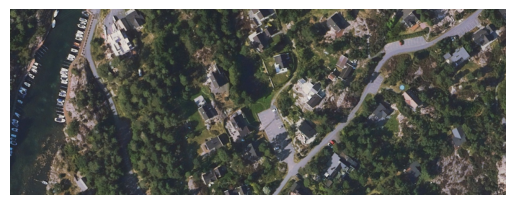

label: 


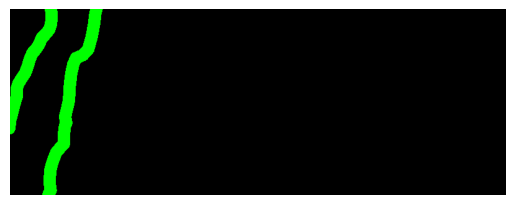

pred: 


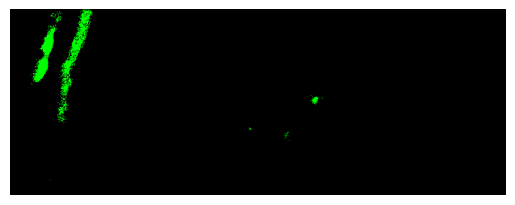

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9868733623348622]
iou class 2:  [0.9868733623348622, 0.49100130890052357]
input: 


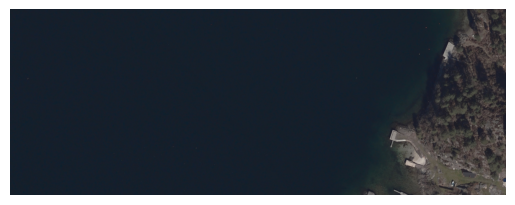

label: 


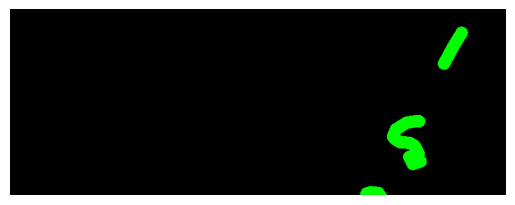

pred: 


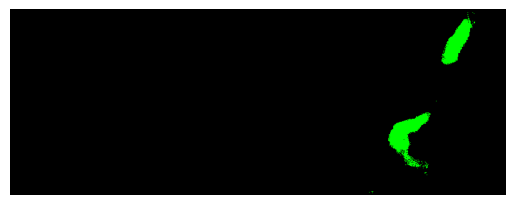

1/1 [==============================] - 0s 27ms/step
iou class 0:  []
iou class 1:  [0.9851846843610947]
iou class 2:  [0.9851846843610947, 0.4888467706662779]
input: 


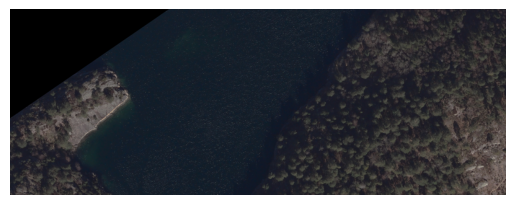

label: 


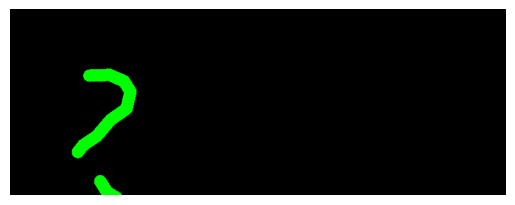

pred: 


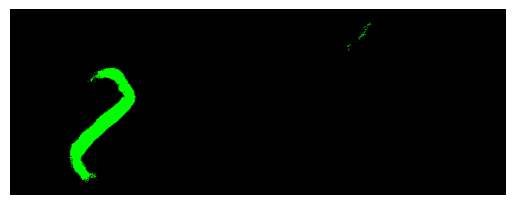

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9279478225143796]
iou class 2:  [0.9279478225143796, 0.2734334541688244]
input: 


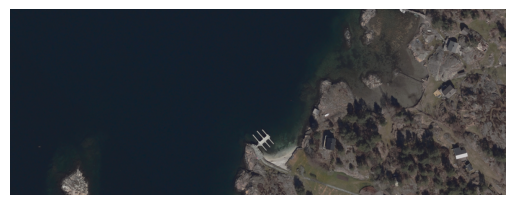

label: 


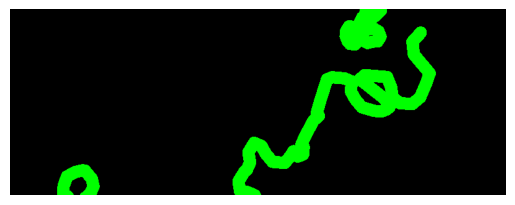

pred: 


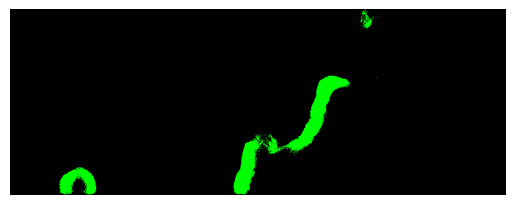

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9602371684849302]
iou class 2:  [0.9602371684849302, 0.23328996584810538]
input: 


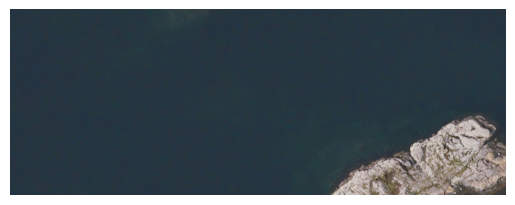

label: 


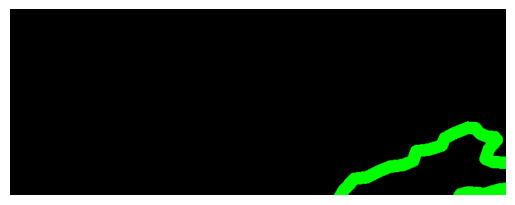

pred: 


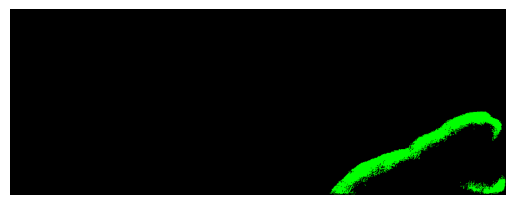

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.8914456544949818]
iou class 2:  [0.8914456544949818, 0.18709223487271331]
input: 


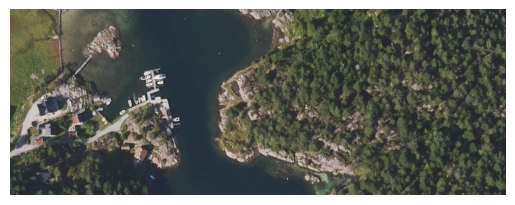

label: 


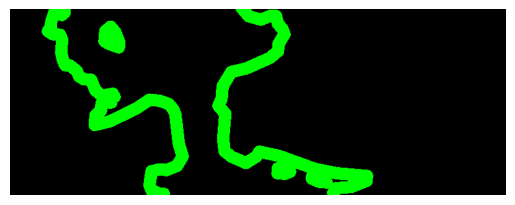

pred: 


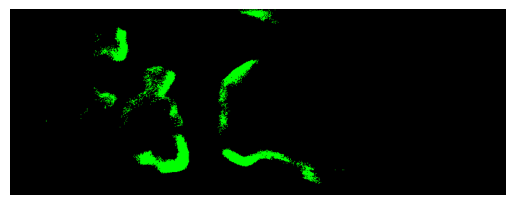

1/1 [==============================] - 0s 26ms/step
iou class 0:  []
iou class 1:  [0.9987625]
iou class 2:  [0.9987625, 0.0]
input: 


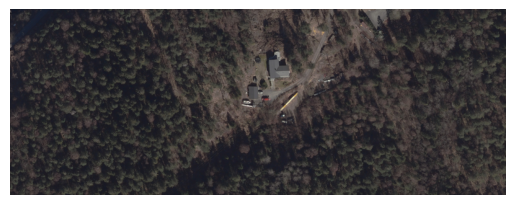

label: 


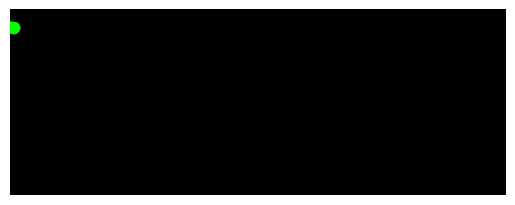

pred: 


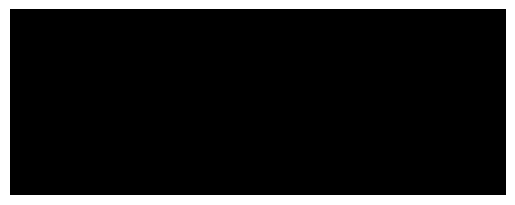

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9382970540062835]
iou class 2:  [0.9382970540062835, 0.375934262861139]
input: 


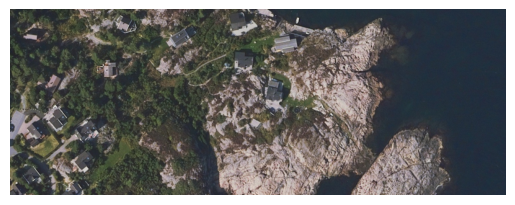

label: 


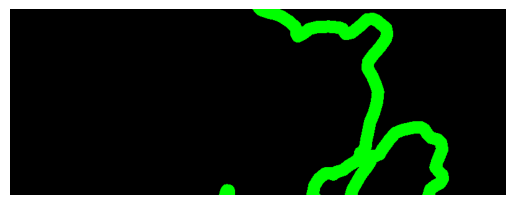

pred: 


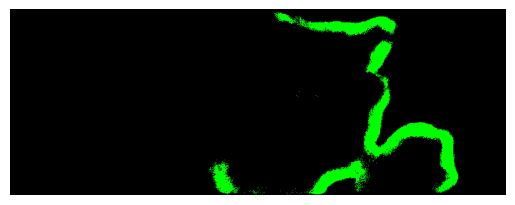

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9548306906165572]
iou class 2:  [0.9548306906165572, 0.44211087420042644]
input: 


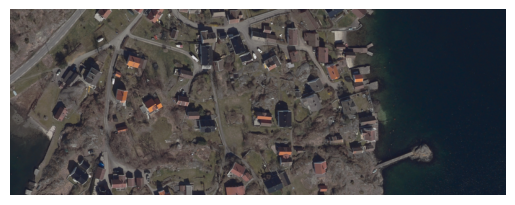

label: 


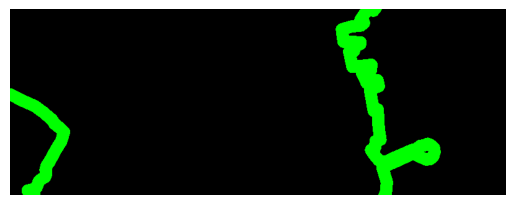

pred: 


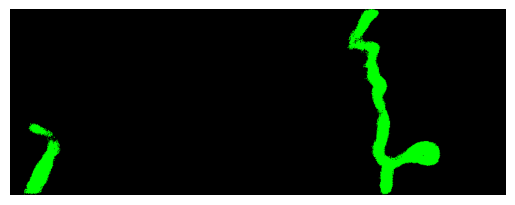

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9454809982222521]
iou class 2:  [0.9454809982222521, 0.10317952962273261]
input: 


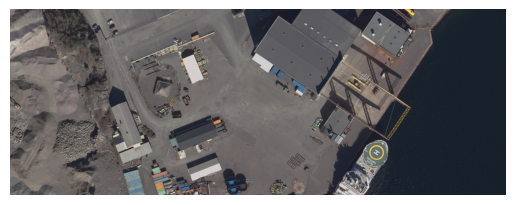

label: 


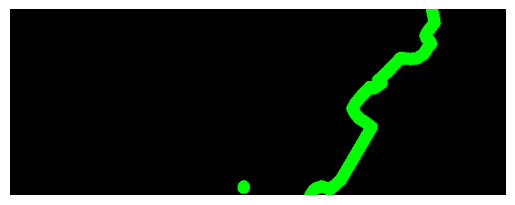

pred: 


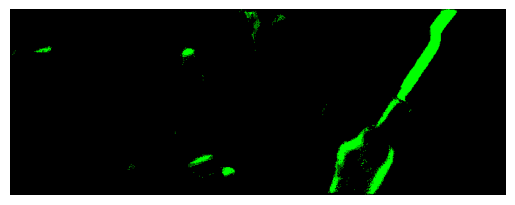

1/1 [==============================] - 0s 27ms/step
iou class 0:  []
iou class 1:  [0.9302985851511854]
iou class 2:  [0.9302985851511854, 0.31748104465037913]
input: 


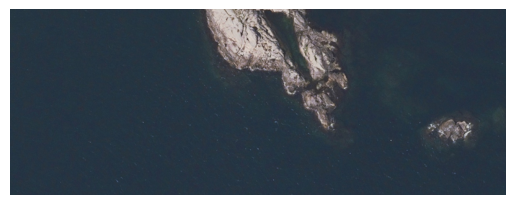

label: 


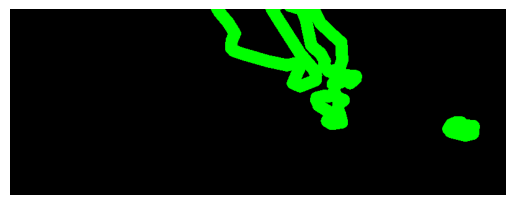

pred: 


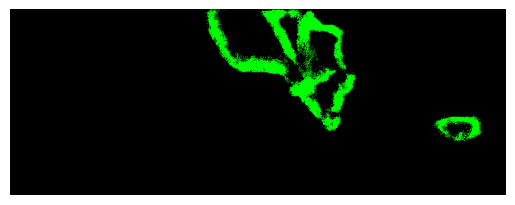

1/1 [==============================] - 0s 26ms/step
iou class 0:  []
iou class 1:  [0.9907830753847863]
iou class 2:  [0.9907830753847863, 0.7347189767556266]
input: 


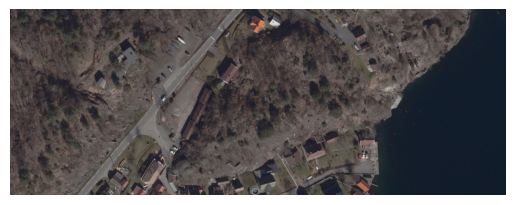

label: 


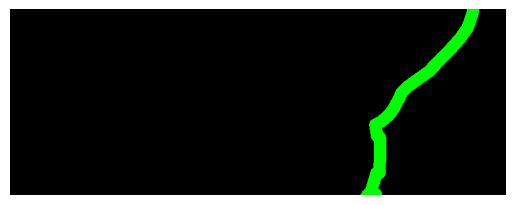

pred: 


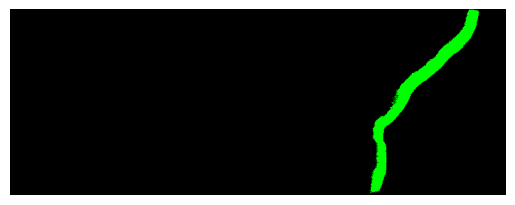

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9729696397511302]
iou class 2:  [0.9729696397511302, 0.43315794167484173]
input: 


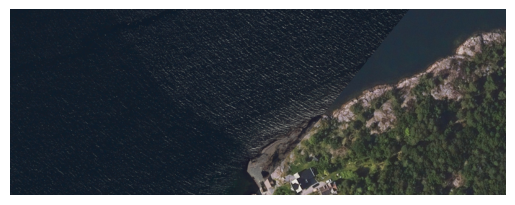

label: 


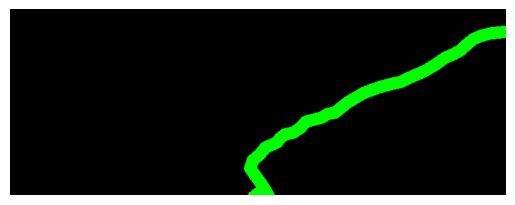

pred: 


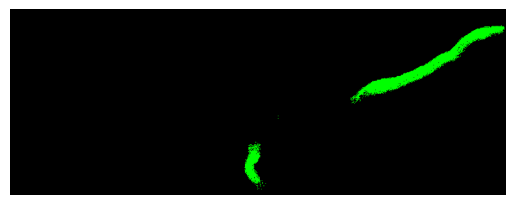

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.9866541666666667]
iou class 2:  [0.9866541666666667, 0.0]
input: 


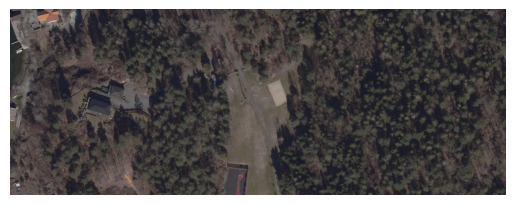

label: 


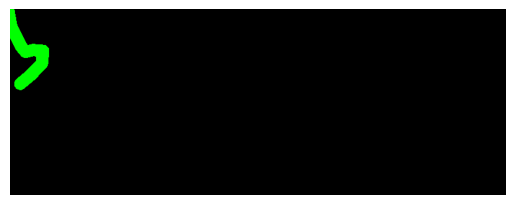

pred: 


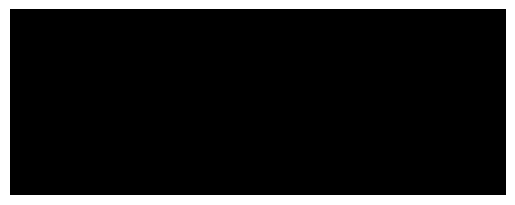

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9911]
iou class 2:  [0.9911, 0.0]
input: 


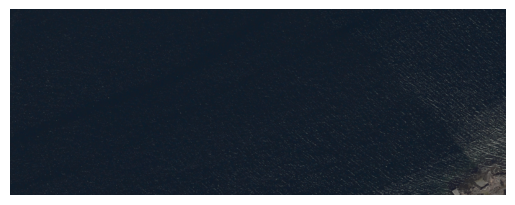

label: 


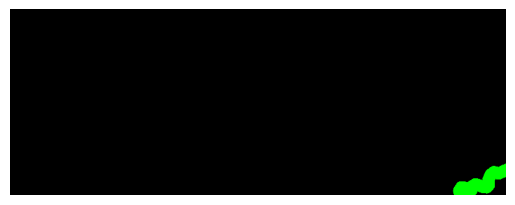

pred: 


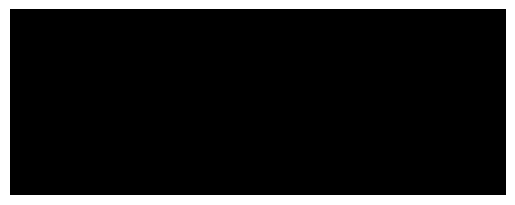

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9960672013819301]
iou class 2:  [0.9960672013819301, 0.6141505553270259]
input: 


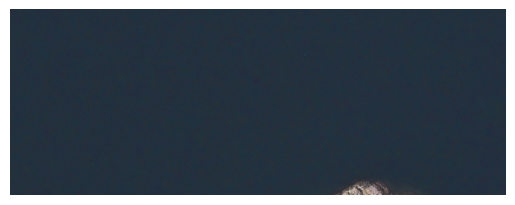

label: 


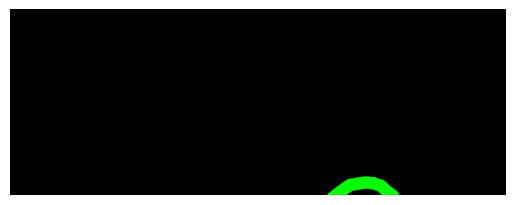

pred: 


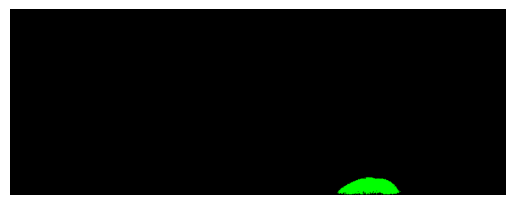

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9540182164795594]
iou class 2:  [0.9540182164795594, 0.26681977843825994]
input: 


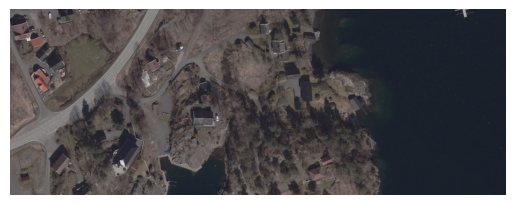

label: 


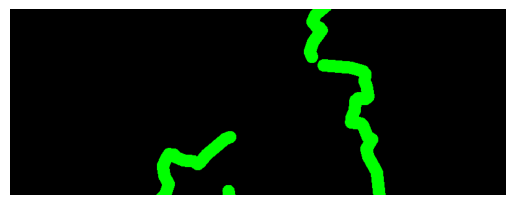

pred: 


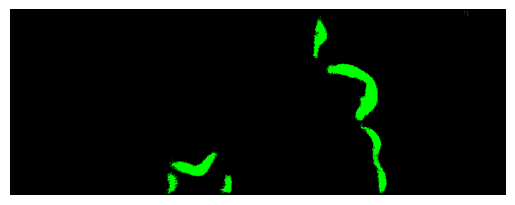

1/1 [==============================] - 0s 26ms/step
iou class 0:  []
iou class 1:  [0.9596521486693022]
iou class 2:  [0.9596521486693022, 0.37875501216065205]
input: 


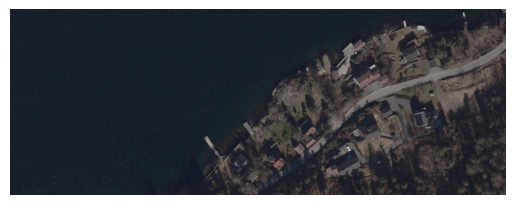

label: 


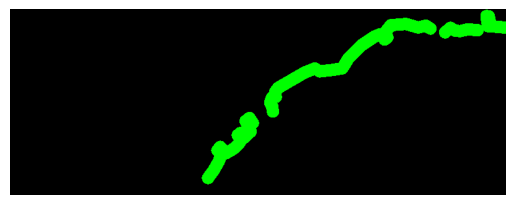

pred: 


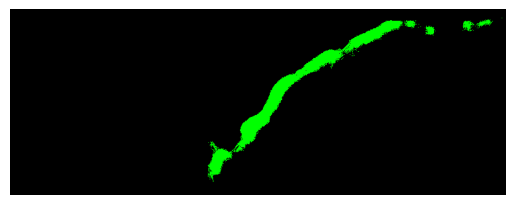

1/1 [==============================] - 0s 29ms/step
iou class 0:  []
iou class 1:  [0.9683561794056366]
iou class 2:  [0.9683561794056366, 0.625032486095951]
input: 


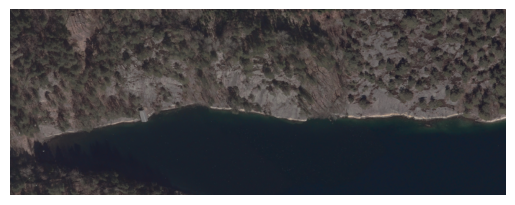

label: 


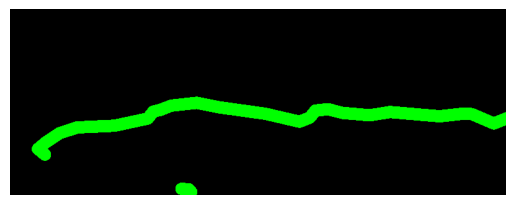

pred: 


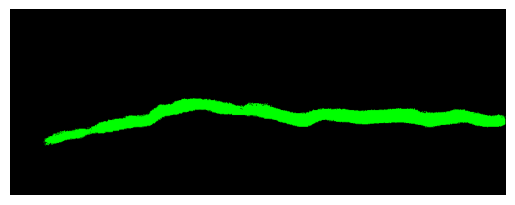

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9710349074070169]
iou class 2:  [0.9710349074070169, 0.2959507944643772]
input: 


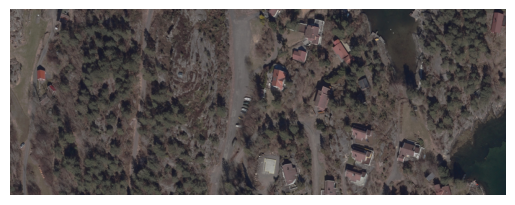

label: 


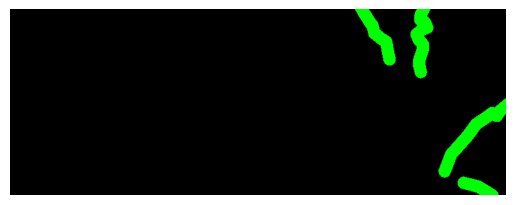

pred: 


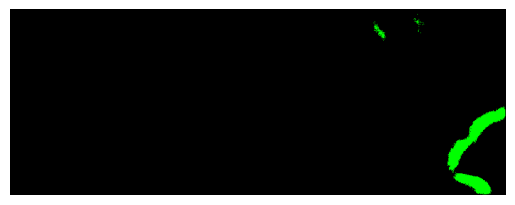

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9373356283475024]
iou class 2:  [0.9373356283475024, 0.4362078452951812]
input: 


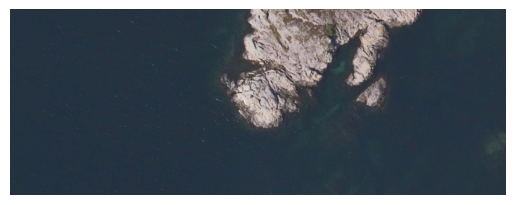

label: 


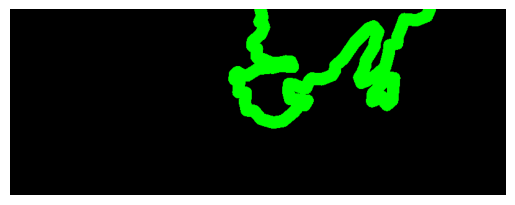

pred: 


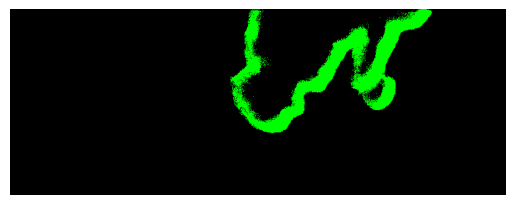

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9821622288492872]
iou class 2:  [0.9821622288492872, 0.5407447973713034]
input: 


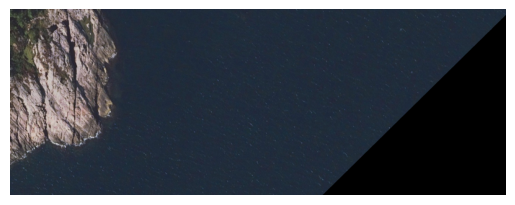

label: 


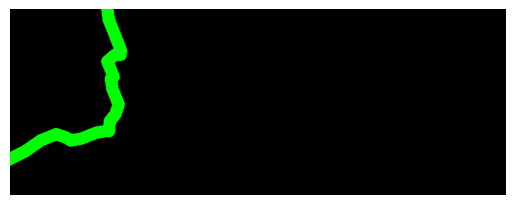

pred: 


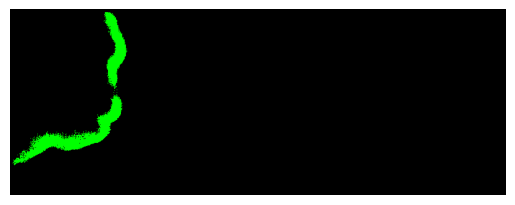

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.9804704467239133]
iou class 2:  [0.9804704467239133, 0.10831426392067124]
input: 


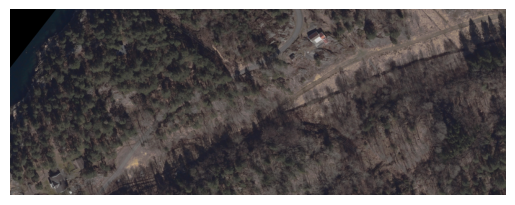

label: 


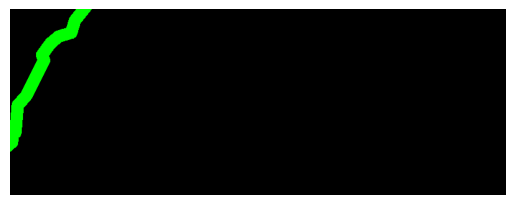

pred: 


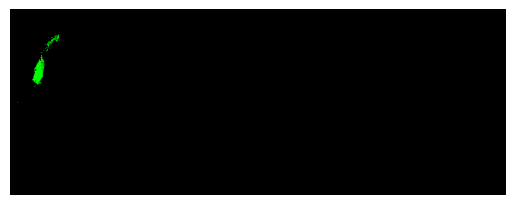

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9803432070937972]
iou class 2:  [0.9803432070937972, 0.5128069990513334]
input: 


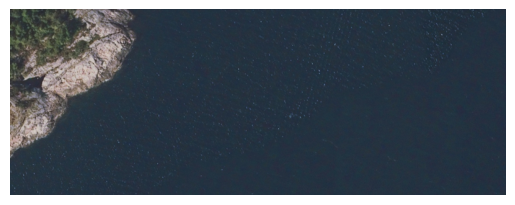

label: 


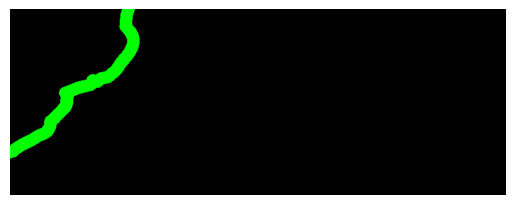

pred: 


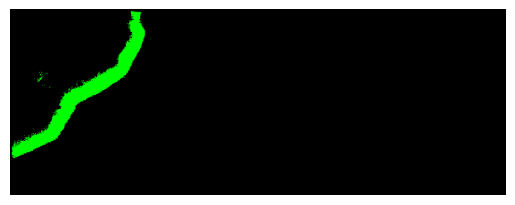

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.9784220417593407]
iou class 2:  [0.9784220417593407, 0.6152190622598002]
input: 


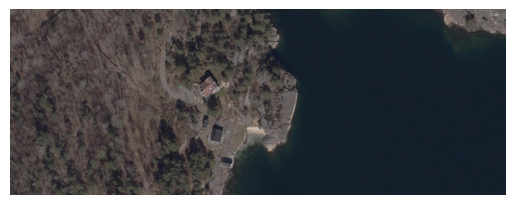

label: 


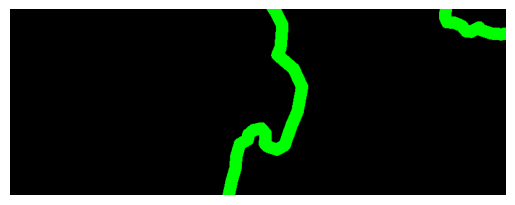

pred: 


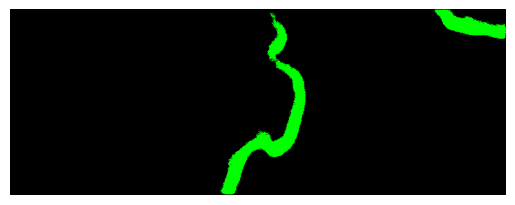

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9827826662366871]
iou class 2:  [0.9827826662366871, 0.2301498127340824]
input: 


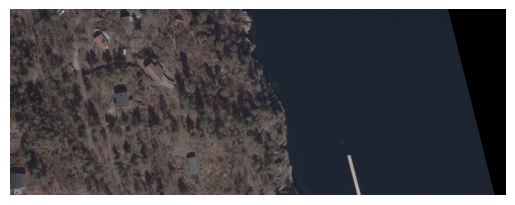

label: 


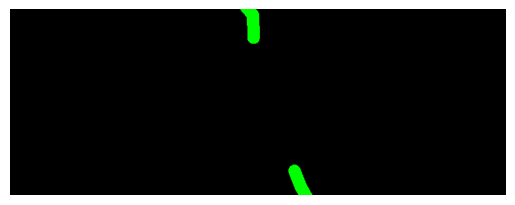

pred: 


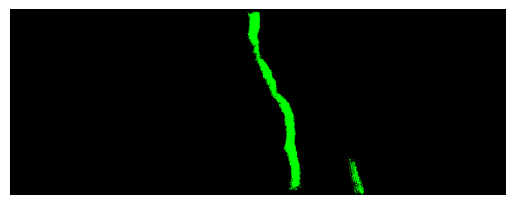

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.9464057885280134]
iou class 2:  [0.9464057885280134, 0.5262069234671974]
input: 


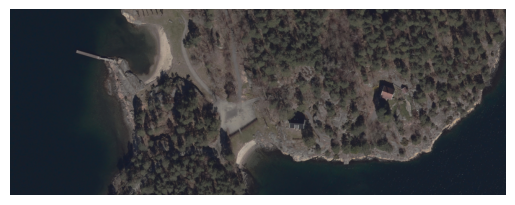

label: 


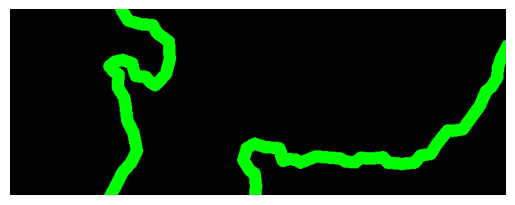

pred: 


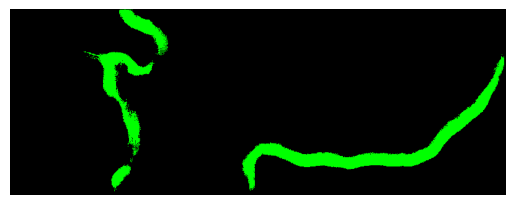

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.8826838553228668]
iou class 2:  [0.8826838553228668, 0.3731421493902439]
input: 


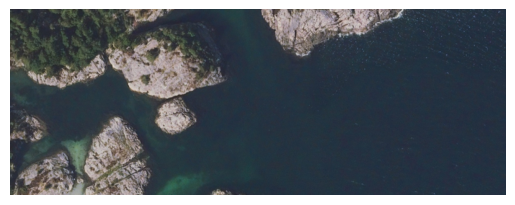

label: 


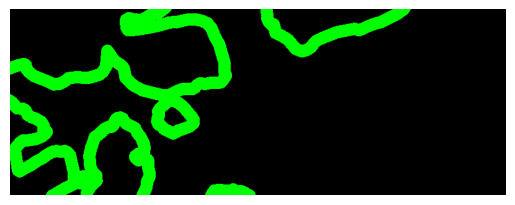

pred: 


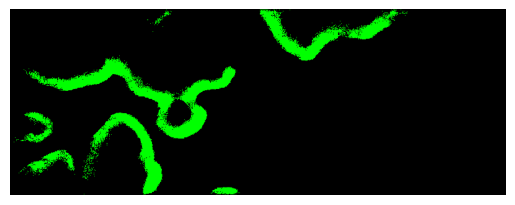

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.98685]
iou class 2:  [0.98685, 0.0]
input: 


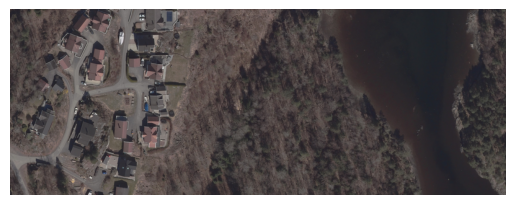

label: 


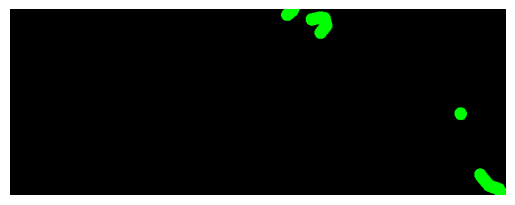

pred: 


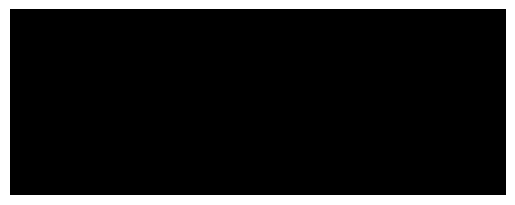

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9598275869478334]
iou class 2:  [0.9598275869478334, 0.43859227674013573]
input: 


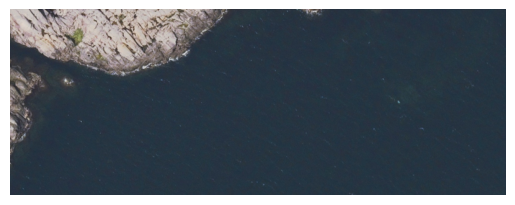

label: 


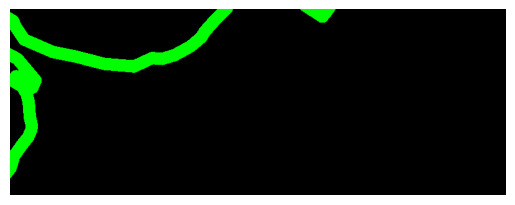

pred: 


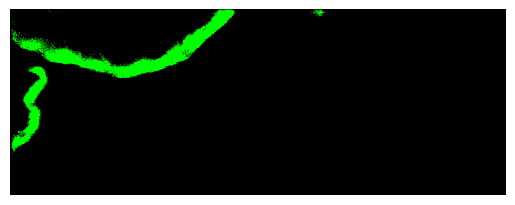

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.8343196093415093]
iou class 2:  [0.8343196093415093, 0.41657231930429073]
input: 


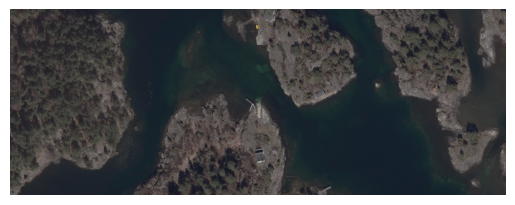

label: 


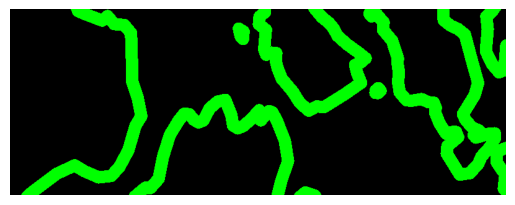

pred: 


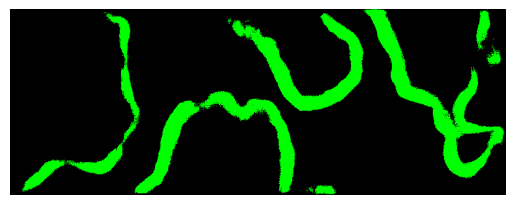

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.933573379687112]
iou class 2:  [0.933573379687112, 0.29313408355733744]
input: 


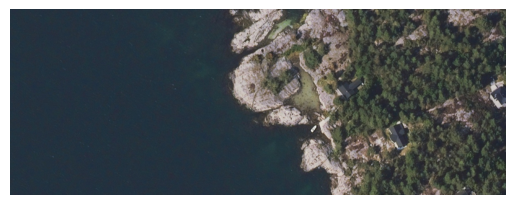

label: 


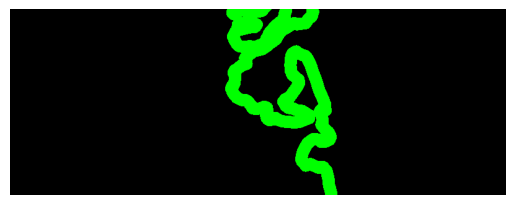

pred: 


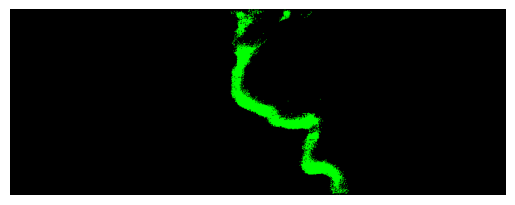

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9917131340976965]
iou class 2:  [0.9917131340976965, 0.22771506422732582]
input: 


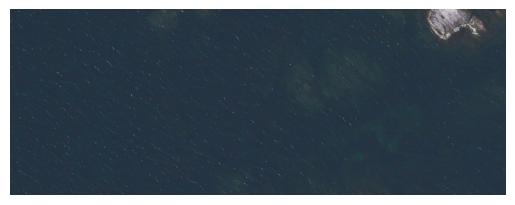

label: 


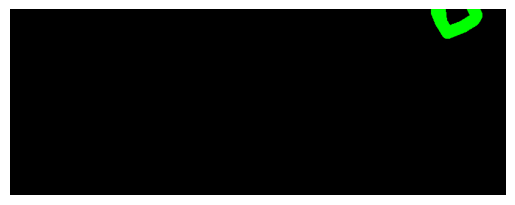

pred: 


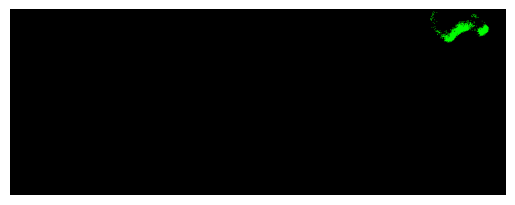

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9855308343203838]
iou class 2:  [0.9855308343203838, 0.6092059838895282]
input: 


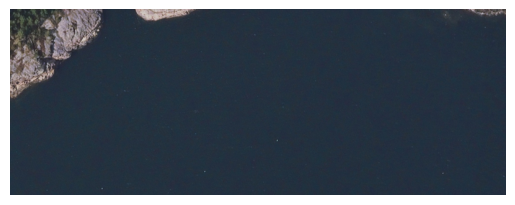

label: 


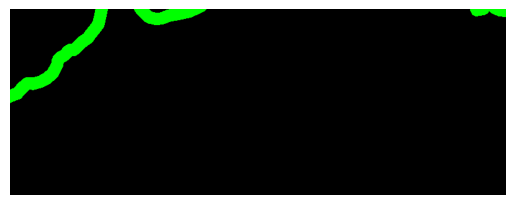

pred: 


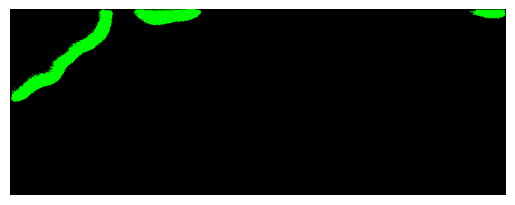

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9706918339329871]
iou class 2:  [0.9706918339329871, 0.20562130177514792]
input: 


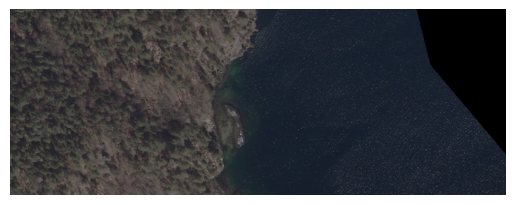

label: 


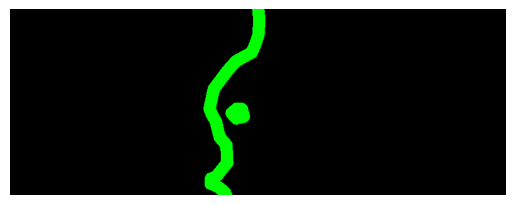

pred: 


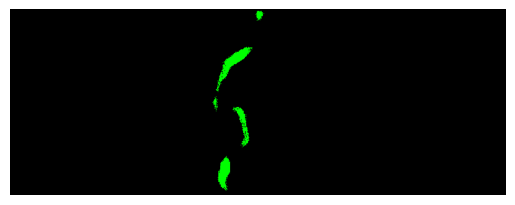

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9824987122015181]
iou class 2:  [0.9824987122015181, 0.5538311265465596]
input: 


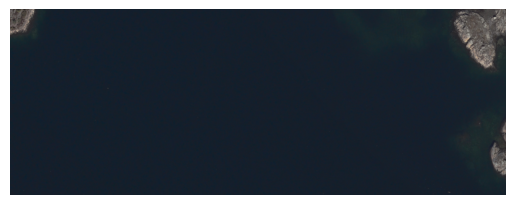

label: 


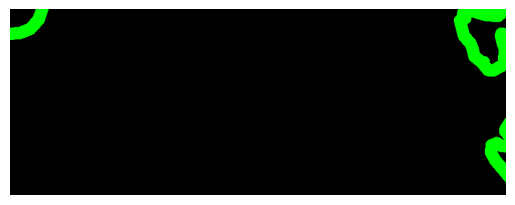

pred: 


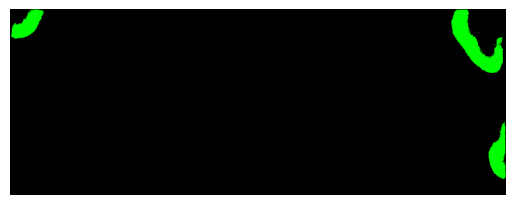

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9576949542283271]
iou class 2:  [0.9576949542283271, 0.5166202229299363]
input: 


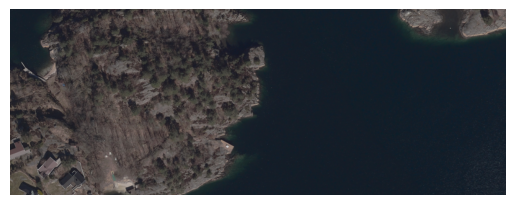

label: 


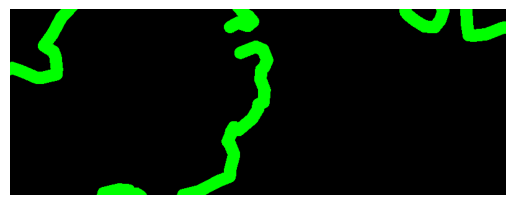

pred: 


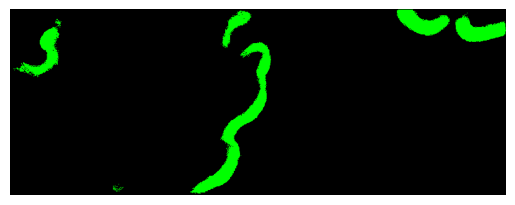

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.9810933234587463]
iou class 2:  [0.9810933234587463, 0.638452037875669]
input: 


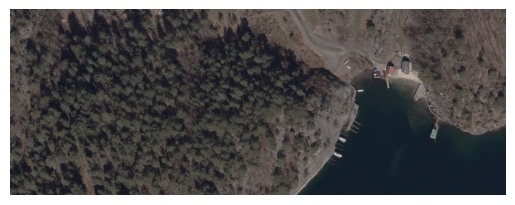

label: 


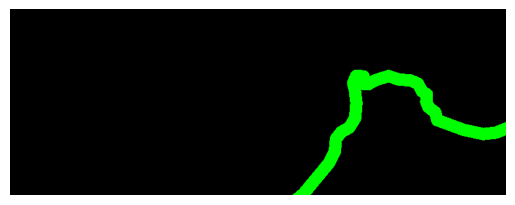

pred: 


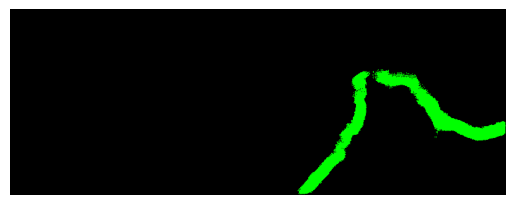

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.9815820413272772]
iou class 2:  [0.9815820413272772, 0.448803948867232]
input: 


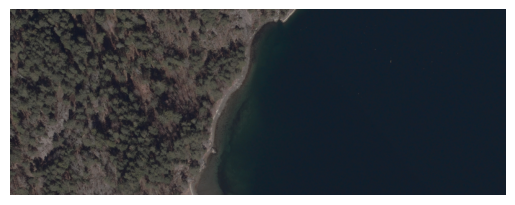

label: 


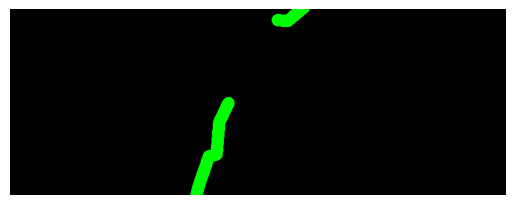

pred: 


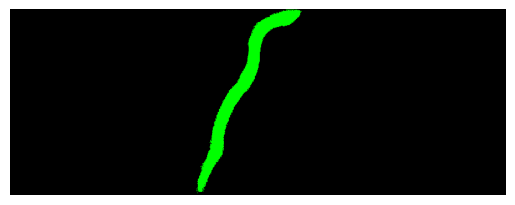

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9347930076620314]
iou class 2:  [0.9347930076620314, 0.09766577633259783]
input: 


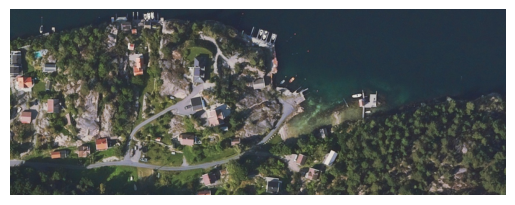

label: 


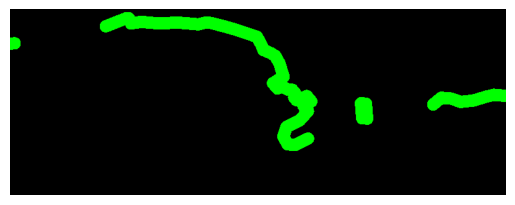

pred: 


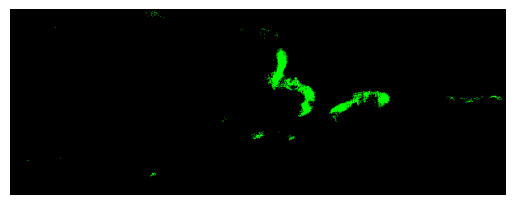

1/1 [==============================] - 0s 24ms/step
iou class 0:  []
iou class 1:  [0.9837945649463974]
iou class 2:  [0.9837945649463974, 0.4663234066239911]
input: 


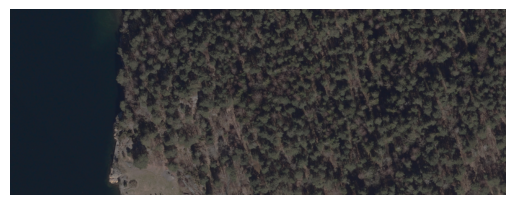

label: 


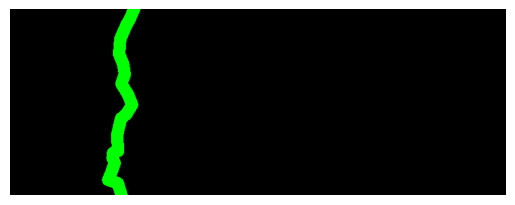

pred: 


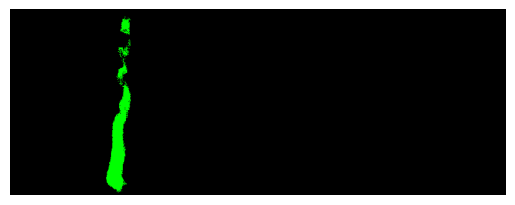

1/1 [==============================] - 0s 26ms/step
iou class 0:  []
iou class 1:  [0.9648199614918845]
iou class 2:  [0.9648199614918845, 0.5637895646537755]
input: 


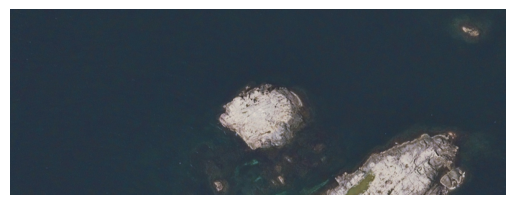

label: 


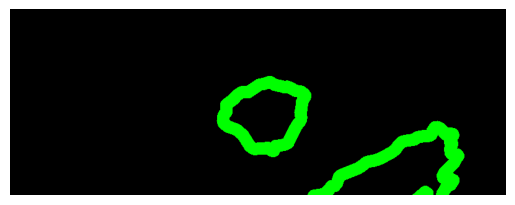

pred: 


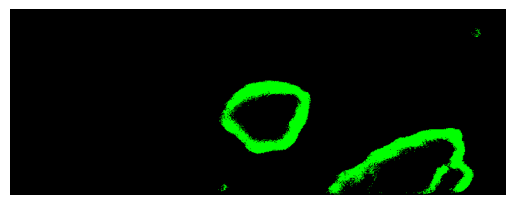

1/1 [==============================] - 0s 25ms/step
iou class 0:  []
iou class 1:  [0.9927037410515613]
iou class 2:  [0.9927037410515613, 0.00793201133144476]
input: 


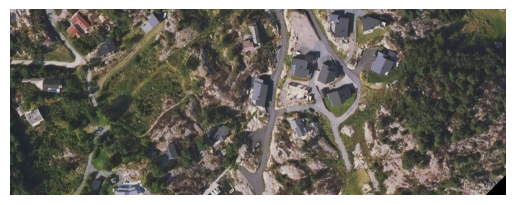

label: 


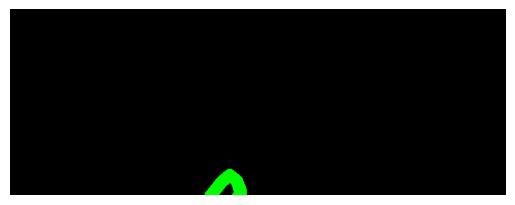

pred: 


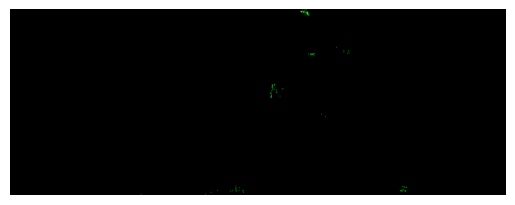

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.9122629866487154]
iou class 2:  [0.9122629866487154, 0.4676650782845473]
input: 


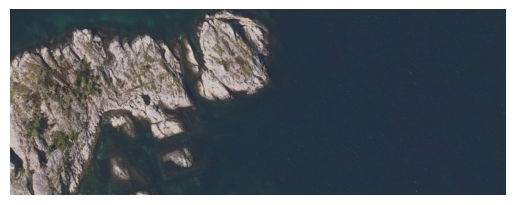

label: 


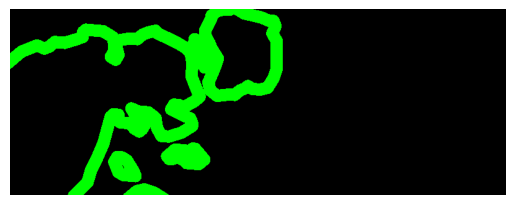

pred: 


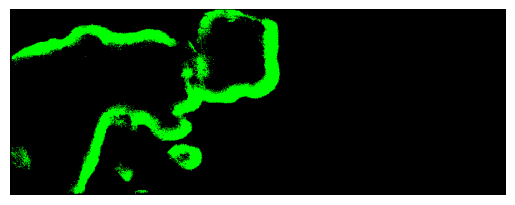

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.9884331292958999]
iou class 2:  [0.9884331292958999, 0.6911664003652134]
input: 


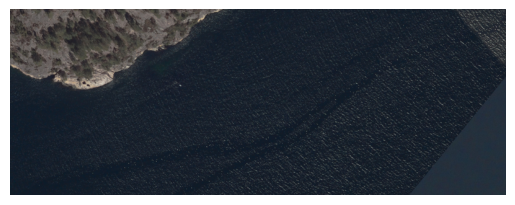

label: 


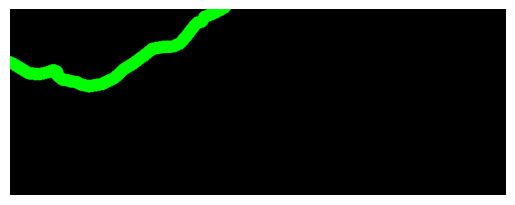

pred: 


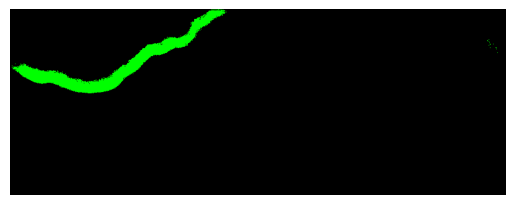

1/1 [==============================] - 0s 23ms/step
iou class 0:  []
iou class 1:  [0.9866595918913047]
iou class 2:  [0.9866595918913047, 0.1695708712613784]
input: 


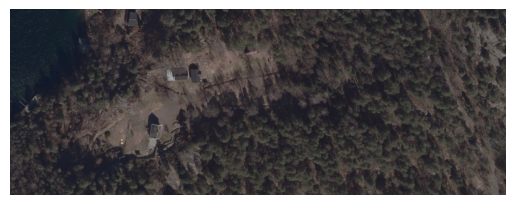

label: 


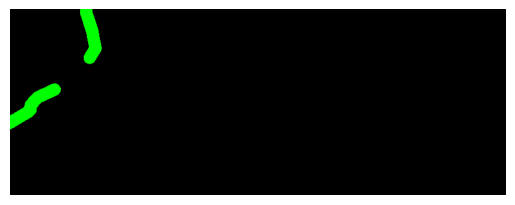

pred: 


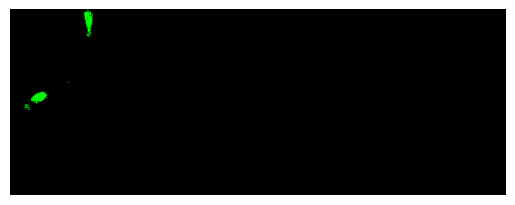

In [13]:
from losses.iou import calculate_iou

val_data_generator = CustomDataGenerator(images_path, labels_path, val_image_ids, image_size=image_size,n_classes=2, batch_size=1, logits=True)
save_dir = "./results/test/"
image_id = 0
for x_val, y_val in val_data_generator:
    test = model.predict(x_val)
    test = np.squeeze(test[-1])
    #mask = np.where(test[:,:,:] > 0.5, 2, 0)
    #mask[:,:,0] = 1
    res = np.argmax(test, axis=-1)
    for i in range(n_classes+1):
        print(f"iou class {i}: ", calculate_iou(y_val, res, i))
    # res = np.reshape(res, (480, 640))
    copy = np.zeros((res.shape[0], res.shape[1], 3), dtype=np.uint8)
    for class_idx in range(4):
        color = class_colors.get(class_idx, [0, 0, 0])
        # Create a mask where pixels equal to class_idx will be True
        mask = (res == class_idx)
        # Set the corresponding pixels to the class-specific color
        copy[mask] = color
    res = copy
   
    y_val = np.squeeze(y_val)
    
    copy = np.zeros((y_val.shape[0], y_val.shape[1], 3), dtype=np.uint8)
    for class_idx in range(4):
        color = class_colors.get(class_idx, [0, 0, 0])
    
        # Create a mask where pixels equal to class_idx will be True
        mask = (y_val == class_idx)
    
        # Set the corresponding pixels to the class-specific color
        copy[mask] = color

    print("input: ")
    plt.imshow(np.squeeze(x_val))
    plt.axis('off')
    plt.show()
    
    print("label: ")
    plt.imshow(copy)
    plt.axis('off')
    plt.show()

    print("pred: ")
    plt.imshow(np.squeeze(res))
    plt.axis('off')
    plt.show()

    np.save(save_dir + f"input_{image_id}", np.squeeze(x_val))
    np.save(save_dir + f"label_{image_id}", np.squeeze(copy))
    np.save(save_dir + f"pred_{image_id}", np.squeeze(res))
    image_id += 1
    



In [27]:
val_data_generator = CustomDataGenerator(images_path, labels_path, val_image_ids, image_size=image_size,n_classes=4, batch_size=1, logits=True)
save_dir = "./results/CCE_LR0.0001, filtersx2/"
image_id = 0
for x_val, y_val in val_data_generator:
    test = model.predict(x_val)
    test = np.squeeze(test[-1])
    #mask = np.where(test[:,:,:] > 0.5, 2, 0)
    #mask[:,:,0] = 1
    res = np.argmax(test, axis=-1)
    # res = np.reshape(res, (480, 640))
    copy = np.zeros((res.shape[0], res.shape[1], 3), dtype=np.uint8)
    for class_idx in range(4):
        color = class_colors.get(class_idx, [0, 0, 0])

        # Create a mask where pixels equal to class_idx will be True
        mask = (res == class_idx)
        
        # Set the corresponding pixels to the class-specific color
        copy[mask] = color
    res = copy
   

1/1 [==============================] - 0s 24ms/step


IndexError: boolean index did not match indexed array along dimension 2; dimension is 3 but corresponding boolean dimension is 800

In [28]:
test.shape

(1, 300, 800, 4)

In [31]:
os.listdir("./results/test")

[]

In [16]:
y_val.shape

(300, 800, 4)